In [ ]:
# Install mtcnn library
! pip install mtcnn

     |████████████████████████████████| 2.3 MB 4.2 MB/s 


#**Import The Required Libraries**

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Rescaling, RandomFlip, RandomRotation
from tensorflow.keras.backend import clear_session
from tensorflow.keras.utils import image_dataset_from_directory, array_to_img, img_to_array, load_img
from tensorflow.keras.preprocessing.image import smart_resize
from tensorflow.keras.optimizers import Adam
from mtcnn.mtcnn import MTCNN
from matplotlib.patches import Rectangle
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import os # getting path
import glob

In [ ]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to dataset:
path = "/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Face_Mask_Dataset"
train_path = path+"/Train"
validation_path = path+"/Validation"
test_path = path+"/Test"

## Data Exploration

In [ ]:
path1 = "/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Face_Mask_Dataset/"
dataset = {"Image_Path":[],"Mask_Status":[],"Data_Type":[]}
for Data_Type in os.listdir(path1):
    for Mask_Status in os.listdir(path1+"/"+Data_Type):
        for image in glob.glob(path1+Data_Type+"/"+Mask_Status+"/"+"*.png"):
            dataset["Image_Path"].append(image)
            dataset["Mask_Status"].append(Mask_Status)
            dataset["Data_Type"].append(Data_Type)
Mask_dataset = pd.DataFrame(dataset)
Mask_dataset.sample(5)

,Image_Path,Mask_Status,Data_Type
5178,/content/drive/MyDrive/Colab Notebooks/DL_Proj...,WithMask,Train
11274,/content/drive/MyDrive/Colab Notebooks/DL_Proj...,WithMask,Validation
9371,/content/drive/MyDrive/Colab Notebooks/DL_Proj...,WithoutMask,Train
1411,/content/drive/MyDrive/Colab Notebooks/DL_Proj...,WithMask,Train
476,/content/drive/MyDrive/Colab Notebooks/DL_Proj...,WithMask,Test


In [ ]:
Mask_dataset.value_counts("Mask_Status")

Mask_Status
WithoutMask    5909
WithMask       5883
dtype: int64

In [ ]:
Mask_dataset.value_counts("Data_Type")

Data_Type
Train         10000
Test            992
Validation      800
dtype: int64

In [ ]:
train_df = Mask_dataset[Mask_dataset["Data_Type"] == "Train"]
test_df =  Mask_dataset[Mask_dataset["Data_Type"] == "Test"]
valid_df = Mask_dataset[Mask_dataset["Data_Type"] == "Validation"]

In [ ]:
def count_plot(df,y, title):
  custom_params = {"axes.spines.right": False, "axes.spines.top": False}
  sns.set_theme(context='talk', style="ticks", rc=custom_params)
  counts = df[y].value_counts().to_dict()
  plt.bar(counts.keys(), counts.values(), color=['green','red'])
  #sns.countplot(test_df["mask_status"])
  plt.title(title, y = 1.05)
  for i, val in enumerate(counts.values()):
    plt.text(i - 0.07, val / 2, f'{val}', color = 'white', fontweight = 'bold')
  plt.xticks(ticks = ['WithoutMask','WithMask'], labels = ['Without Mask', 'With Mask'])
  plt.ylabel('Count')
  plt.show()

In [ ]:
train_df.value_counts("Mask_Status")

Mask_Status
WithMask       5000
WithoutMask    5000
dtype: int64

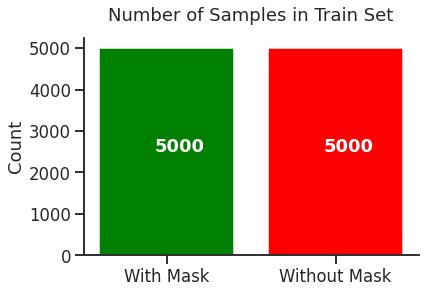

In [ ]:
count_plot(train_df,y = 'Mask_Status', title = 'Number of Samples in Train Set')

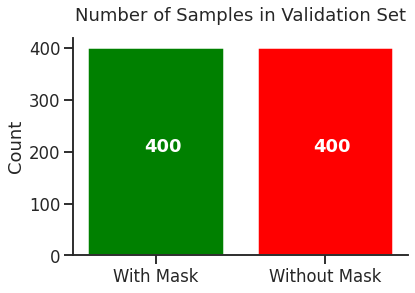

In [ ]:
count_plot(valid_df,y = 'Mask_Status', title = 'Number of Samples in Validation Set')

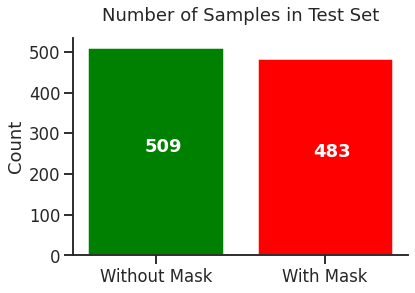

In [ ]:
count_plot(test_df,y = 'Mask_Status', title = 'Number of Samples in Test Set')

##Images Preprocessing - Image Data Generator

In [ ]:
# Obtain a tf.data.Dataset that yields batches of images from the 
# subdirectories ['WithoutMask', 'WithMask']
train_ds = image_dataset_from_directory(directory=train_path, 
                                        class_names = ['WithoutMask', 'WithMask'], 
                                        label_mode = 'categorical', seed=22)
validation_ds = image_dataset_from_directory(directory = validation_path, 
                                             class_names = ['WithoutMask', 'WithMask'], 
                                             label_mode = 'categorical', seed = 22)
test_ds = image_dataset_from_directory(directory = test_path, 
                                       class_names = ['WithoutMask', 'WithMask'], 
                                       label_mode = 'categorical', seed = 22)

Found 10000 files belonging to 2 classes.
Found 800 files belonging to 2 classes.
Found 992 files belonging to 2 classes.


In [ ]:
# Extract test images and labels
def extract_images(test_ds):
  x_test = []
  y_test = []
  for x, y in test_ds.unbatch():
    x_test.append(x.numpy())
    y_test.append(y.numpy())

  x_test = np.array(x_test)
  y_test = np.array(y_test)
  
  def flat(x):
    if x[0] == 1:
      return 0
    else:
      return 1
  y_test = np.apply_along_axis(flat, 1, y_test)
  return x_test, y_test

In [ ]:
x_test, y_test = extract_images(test_ds)

# CNN model

In [ ]:
# CNN
input_dim = (256, 256, 3)
cnn_model = Sequential()
cnn_model.add(Rescaling(1./255, input_shape=input_dim))
cnn_model.add(RandomFlip('horizontal'))
cnn_model.add(RandomRotation(0.2))
cnn_model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', input_shape=input_dim))
cnn_model.add(MaxPooling2D(pool_size=(2,2)))
cnn_model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2,2)))
cnn_model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2,2)))
cnn_model.add(Flatten())
cnn_model.add(Dense(256, activation='relu'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Dense(2, activation='softmax'))

cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 random_flip (RandomFlip)    (None, 256, 256, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 256, 256, 3)      0         
 tion)                                                           
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      1

In [ ]:
history_cnn = cnn_model.fit(train_ds, validation_data=validation_ds, epochs=11)

Epoch 1/11
313/313 [==============================] - 19s 58ms/step - loss: 0.2443 - accuracy: 0.9096 - val_loss: 0.1366 - val_accuracy: 0.9613
Epoch 2/11
313/313 [==============================] - 19s 58ms/step - loss: 0.1619 - accuracy: 0.9454 - val_loss: 0.0836 - val_accuracy: 0.9762
Epoch 3/11
313/313 [==============================] - 19s 58ms/step - loss: 0.1282 - accuracy: 0.9564 - val_loss: 0.1186 - val_accuracy: 0.9575
Epoch 4/11
313/313 [==============================] - 19s 59ms/step - loss: 0.1276 - accuracy: 0.9574 - val_loss: 0.0718 - val_accuracy: 0.9787
Epoch 5/11
313/313 [==============================] - 19s 58ms/step - loss: 0.1031 - accuracy: 0.9656 - val_loss: 0.0825 - val_accuracy: 0.9750
Epoch 6/11
313/313 [==============================] - 19s 58ms/step - loss: 0.1035 - accuracy: 0.9666 - val_loss: 0.0799 - val_accuracy: 0.9775
Epoch 7/11
313/313 [==============================] - 19s 59ms/step - loss: 0.0905 - accuracy: 0.9711 - val_loss: 0.0650 - val_accuracy:

In [ ]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)

In [ ]:
# Plot accuracy and loss
def history_plot(history_cnn):
  custom_params = {"axes.spines.right": False, "axes.spines.top": False}
  sns.set_theme(context='talk', style="ticks", rc=custom_params)
  fig = plt.figure(figsize=(10, 6))
  plt.plot(history_cnn.history['accuracy'])
  plt.plot(history_cnn.history['val_accuracy'])
  plt.title('Model Accuracy', y=1.05)
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['Train Accuracy', 'Validation Accuracy'], loc = 'lower right')
  plt.grid(linestyle='-', linewidth=0.5)
  #plt.ylim([0.6, 1]); 
  plt.ylim(top=1)
  plt.xlim([0, 11])
  plt.show()

def loss_plot(history_cnn):
  custom_params = {"axes.spines.right": False, "axes.spines.top": False}
  sns.set_theme(context='talk', style="ticks", rc=custom_params)
  fig = plt.figure(figsize=(10, 6))
  plt.plot(history_cnn.history['loss'])
  plt.plot(history_cnn.history['val_loss'])
  plt.title('Model Loss', y=1.05)
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train Loss', 'Validation Loss'], loc = 'upper right')
  plt.grid(linestyle='-', linewidth=0.5)
  #plt.ylim([0, 1]); 
  plt.xlim([0, 11])
  plt.show()

In [ ]:
'upper left', , 'lower left', 'lower right'

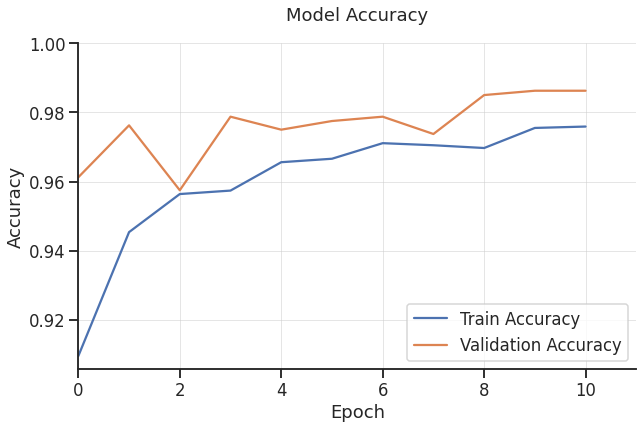

In [ ]:
history_plot(history_cnn)

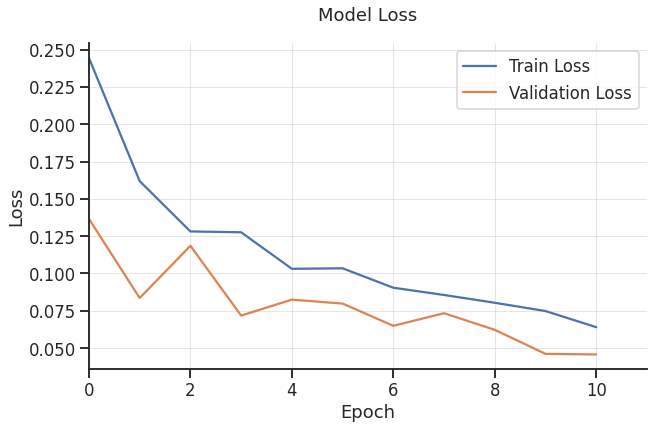

In [ ]:
loss_plot(history_cnn)

## Evaluation

In [ ]:
# Metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report,confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.metrics import roc_auc_score, roc_curve, plot_roc_curve, precision_score, recall_score
from imblearn.metrics import specificity_score, sensitivity_score
from sklearn.metrics import precision_recall_fscore_support

In [ ]:
# Function to calculate the classification metrics: Accuracy, Sensitivity, Specificity, 
# roc_auc, Confusion matrix, and Classification report
def classification_metrics(y_test_pred, y_test, model_name):
    # Test accuracy
    test_accur = accuracy_score(y_test, y_test_pred)
    
    precision = precision_score(y_test, y_test_pred , average="macro")
    recall = recall_score(y_test, y_test_pred , average="macro")
    f_score = f1_score(y_test, y_test_pred , average="macro")
    roc_auc = roc_auc_score(y_test, y_test_pred)
    model = {'Model': model_name,
             'Test Accuracy': test_accur,
             'Precision':precision,
             'Recall':recall, 
             'f_score':f_score,
             'ROC_AUC':roc_auc}
    model_df = pd.DataFrame(model, index=[0])
    #display(NB_model_df)
    
    print("\nTest accuracy of {}: {:.3f}".format(model_name, test_accur))
    print("\nPrecision Score of {}: {:.3f}".format(model_name, precision))
    print("\nRecall Score of {}: {:.3f}".format(model_name, recall))
    print("\nf_score {}: {:.3f}".format(model_name, f_score))
    print("\nThe roc_auc of {}: {:.3f}".format(model_name, roc_auc))

    # Classification report
    print("\nClassification report:\n\n", classification_report(y_test,y_test_pred,target_names=['No Mask', 'Masked']))
    print('Summary of classification metrics:')
    display(model_df)
    return model_df


#sns.set_theme(style="white", palette=None)
def confusion_matrix_plot(y_test, y_pred):
  sns.set_theme(context='talk', style="ticks")
  cm = confusion_matrix(y_test, y_pred)
  ConfusionMatrixDisplay(cm, display_labels=['No Mask', 'Masked']).plot()
  plt.title('Confusion Matrix',y = 1.05)


# Create a function to plot roc_curve
def roc_curve_plot(y_pred, y_test, model_name):
    custom_params = {"axes.spines.right": False, "axes.spines.top": False}
    sns.set_theme(context='talk', style="ticks", rc=custom_params)
    # Calculating the false positive and true positive rates
    roc_auc = roc_auc_score(y_test, y_pred)
    FP_rate, TP_rate, thresholds = roc_curve(y_test, y_pred)
    plt.figure(figsize=(10,6))
    plt.plot(FP_rate, TP_rate, label=f'{model_name} (area = {roc_auc:.3f})')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.title('ROC for '+model_name)
    plt.legend(loc="lower right")
    plt.show()

In [ ]:
cnn_model.evaluate(test_ds)

31/31 [==============================] - 2s 41ms/step - loss: 0.0534 - accuracy: 0.9819


[0.053443070501089096, 0.9818548560142517]

In [ ]:
# Confusion Matrix
def transform(x):
  if x[0] >= x[1]:
    return 0
  else:
    return 1


#x_test, y_test
y_pred_cnn = cnn_model.predict(x_test)
y_pred_cnn = np.apply_along_axis(transform, 1, y_pred_cnn)

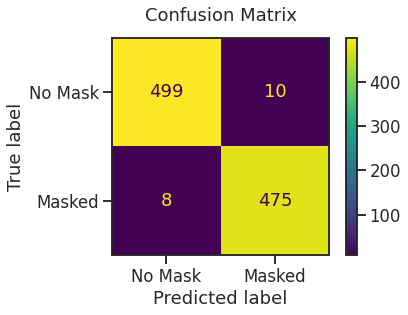

In [ ]:
confusion_matrix_plot(y_test, y_pred_cnn)

In [ ]:
CNN_model_df = classification_metrics(y_pred_cnn, y_test, model_name = 'CNN Model')


Test accuracy of CNN Model: 0.982

Precision Score of CNN Model: 0.982

Recall Score of CNN Model: 0.982

f_score CNN Model: 0.982

The roc_auc of CNN Model: 0.982

Classification report:

               precision    recall  f1-score   support

     No Mask       0.98      0.98      0.98       509
      Masked       0.98      0.98      0.98       483

    accuracy                           0.98       992
   macro avg       0.98      0.98      0.98       992
weighted avg       0.98      0.98      0.98       992

Summary of classification metrics:


,Model,Test Accuracy,Precision,Recall,f_score,ROC_AUC
0,CNN Model,0.981855,0.981801,0.981895,0.981844,0.981895


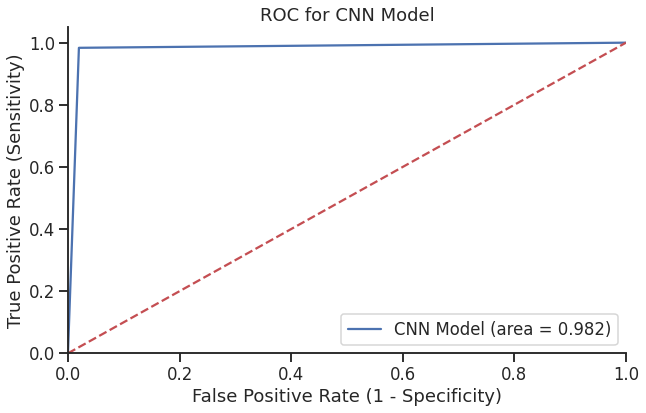

In [ ]:
roc_curve_plot(y_pred_cnn, y_test, model_name = 'CNN Model')

In [ ]:
# Save the Model
cnn_model.save("/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Outputs/cnn_model.h5")


# Transfer learning with VGG19

In [ ]:
# Data augmentation
data_augmentation = Sequential([
  layers.RandomFlip('horizontal'),
  layers.RandomRotation(0.2),
])

In [ ]:
# Instantiate base model
base_model = VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3), pooling='avg')

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
# Freeze the pre-trained parameters
base_model.trainable = False

In [ ]:
inputs = Input(shape=(256, 256, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = Dropout(0.2)(x)
outputs = Dense(2, activation='softmax')(x)
vgg_model = keras.Model(inputs, outputs)

vgg_model.compile(optimizer=Adam(learning_rate=0.001/10), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 256, 256, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 256, 256, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                             

In [ ]:
init_epochs = 11
history_vgg = vgg_model.fit(train_ds, validation_data=validation_ds, epochs=init_epochs)

Epoch 1/11
313/313 [==============================] - 44s 134ms/step - loss: 0.6894 - accuracy: 0.8079 - val_loss: 0.2272 - val_accuracy: 0.9400
Epoch 2/11
313/313 [==============================] - 42s 131ms/step - loss: 0.2849 - accuracy: 0.9351 - val_loss: 0.1242 - val_accuracy: 0.9675
Epoch 3/11
313/313 [==============================] - 42s 132ms/step - loss: 0.1932 - accuracy: 0.9559 - val_loss: 0.0857 - val_accuracy: 0.9787
Epoch 4/11
313/313 [==============================] - 42s 132ms/step - loss: 0.1433 - accuracy: 0.9656 - val_loss: 0.0651 - val_accuracy: 0.9837
Epoch 5/11
313/313 [==============================] - 42s 132ms/step - loss: 0.1210 - accuracy: 0.9703 - val_loss: 0.0535 - val_accuracy: 0.9850
Epoch 6/11
313/313 [==============================] - 42s 131ms/step - loss: 0.1026 - accuracy: 0.9738 - val_loss: 0.0451 - val_accuracy: 0.9875
Epoch 7/11
313/313 [==============================] - 41s 131ms/step - loss: 0.0950 - accuracy: 0.9757 - val_loss: 0.0402 - val_ac

In [ ]:
vgg_model.evaluate(test_ds)

31/31 [==============================] - 4s 120ms/step - loss: 0.0271 - accuracy: 0.9929


[0.027055595070123672, 0.992943525314331]

Fine-tune

In [ ]:
# Unfreeze base model
base_model.trainable = True

In [ ]:
# Check layers
len(base_model.layers)

23

In [ ]:
# Fine tune from this layer onwards
fine_tune_at = 20

In [ ]:
# Freeze all layers before first fine tune layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

In [ ]:
# Re-compile the model
vgg_model.compile(optimizer=Adam(learning_rate=0.001/100), loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 256, 256, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 256, 256, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                             

In [ ]:
fine_tune_epochs = 11
total_epochs =  init_epochs + fine_tune_epochs

history_vggfine = vgg_model.fit(train_ds,
                         epochs=total_epochs,
                         initial_epoch=history_vgg.epoch[-1],
                         validation_data=validation_ds)

Epoch 11/22
313/313 [==============================] - 44s 134ms/step - loss: 0.0427 - accuracy: 0.9870 - val_loss: 0.0154 - val_accuracy: 0.9950
Epoch 12/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0251 - accuracy: 0.9927 - val_loss: 0.0114 - val_accuracy: 0.9962
Epoch 13/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0187 - accuracy: 0.9951 - val_loss: 0.0083 - val_accuracy: 0.9962
Epoch 14/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0178 - accuracy: 0.9944 - val_loss: 0.0071 - val_accuracy: 0.9975
Epoch 15/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0142 - accuracy: 0.9960 - val_loss: 0.0061 - val_accuracy: 0.9975
Epoch 16/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0106 - accuracy: 0.9970 - val_loss: 0.0050 - val_accuracy: 0.9962
Epoch 17/22
313/313 [==============================] - 42s 133ms/step - loss: 0.0119 - accuracy: 0.9963 - val_loss: 0.0054 -

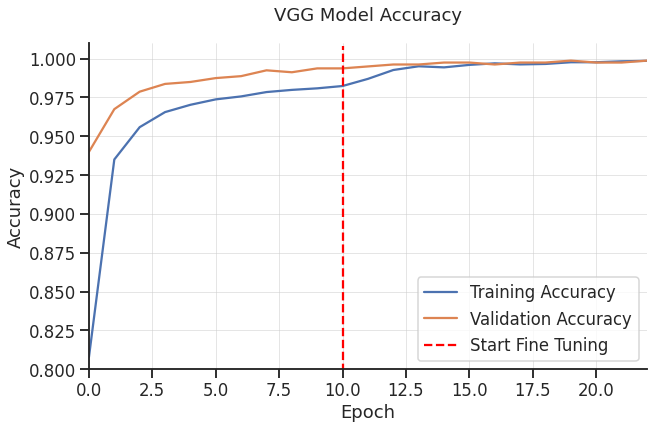

In [ ]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)


fig = plt.figure(figsize=(10, 6))
plt.plot(history_vgg.history['accuracy'] + history_vggfine.history['accuracy'], label='Training Accuracy')
plt.plot(history_vgg.history['val_accuracy'] + history_vggfine.history['val_accuracy'], label='Validation Accuracy')

plt.plot([init_epochs-1,init_epochs-1], plt.ylim(), label='Start Fine Tuning',color='red',linestyle='dashed')
plt.legend(loc='lower right')
plt.title('VGG Model Accuracy', y=1.05)
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.grid(linestyle='-', linewidth=0.5)
plt.ylim([0.8, 1.01]); plt.xlim([0, 22]);

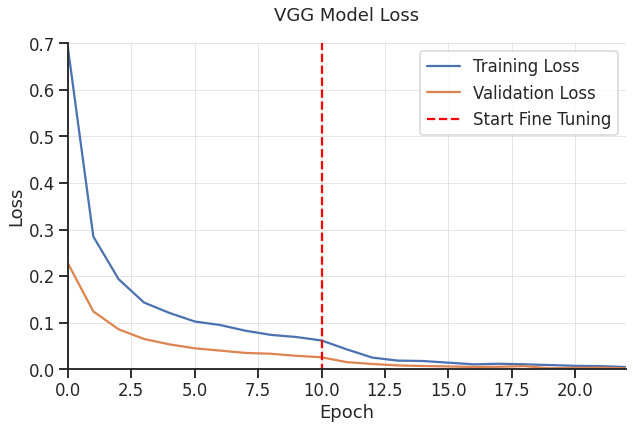

In [ ]:
fig = plt.figure(figsize=(10, 6))
plt.plot(history_vgg.history['loss'] + history_vggfine.history['loss'], label='Training Loss')
plt.plot(history_vgg.history['val_loss'] + history_vggfine.history['val_loss'], label='Validation Loss')
plt.plot([init_epochs-1,init_epochs-1], plt.ylim(), label='Start Fine Tuning',color='red',linestyle='dashed')
plt.legend(loc='upper right')
plt.title('VGG Model Loss',  y=1.05)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(linestyle='-', linewidth=0.5)
plt.ylim([0, 0.7]); plt.xlim([0, 22])
plt.show()

In [ ]:
vgg_model.evaluate(test_ds)

31/31 [==============================] - 4s 120ms/step - loss: 0.0064 - accuracy: 0.9970


[0.006425174884498119, 0.9969757795333862]

In [ ]:
# Confusion matrix
y_pred_vgg = vgg_model.predict(x_test)
y_pred_vgg = np.apply_along_axis(transform, 1, y_pred_vgg)

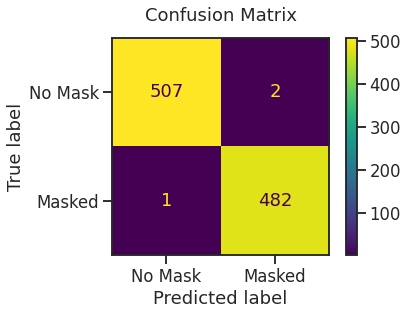

In [ ]:
confusion_matrix_plot(y_test, y_pred_vgg)

In [ ]:
vgg_model_df = classification_metrics(y_pred_vgg, y_test, model_name = 'VGG Model')


Test accuracy of VGG Model: 0.997

Precision Score of VGG Model: 0.997

Recall Score of VGG Model: 0.997

f_score VGG Model: 0.997

The roc_auc of VGG Model: 0.997

Classification report:

               precision    recall  f1-score   support

     No Mask       1.00      1.00      1.00       509
      Masked       1.00      1.00      1.00       483

    accuracy                           1.00       992
   macro avg       1.00      1.00      1.00       992
weighted avg       1.00      1.00      1.00       992

Summary of classification metrics:


,Model,Test Accuracy,Precision,Recall,f_score,ROC_AUC
0,VGG Model,0.996976,0.99695,0.997,0.996974,0.997


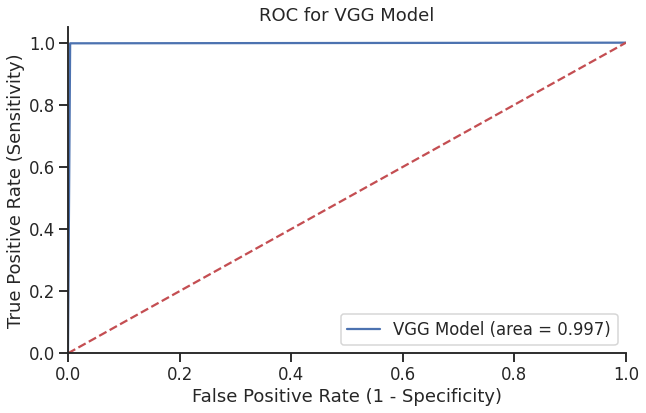

In [ ]:
roc_curve_plot(y_pred_vgg, y_test, model_name = 'VGG Model')

In [ ]:
# Save the model
vgg_model.save("/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Outputs/mask_detector_vgg19.h5")


## Model Comparison, Evaluation


In [ ]:
df_summary = pd.DataFrame()
models=[vgg_model_df, CNN_model_df]

for df in models:
    df_summary=df_summary.append(df).reset_index().drop('index', axis=1)
df_summary

,Model,Test Accuracy,Precision,Recall,f_score,ROC_AUC
0,VGG Model,0.996976,0.996950,0.997000,0.996974,0.997000
1,CNN Model,0.981855,0.981801,0.981895,0.981844,0.981895


In [ ]:
df_summary.sort_values('Test Accuracy', ascending=False).reset_index().drop('index', axis=1) # And sort it by Test Accuracy:

,Model,Test Accuracy,Precision,Recall,f_score,ROC_AUC
0,VGG Model,0.996976,0.996950,0.997000,0.996974,0.997000
1,CNN Model,0.981855,0.981801,0.981895,0.981844,0.981895


In [ ]:
df_summary.set_index('Model',inplace=True)
df_summary

,Test Accuracy,Precision,Recall,f_score,ROC_AUC
Model,,,,,
VGG Model,0.996976,0.996950,0.997000,0.996974,0.997000
CNN Model,0.981855,0.981801,0.981895,0.981844,0.981895


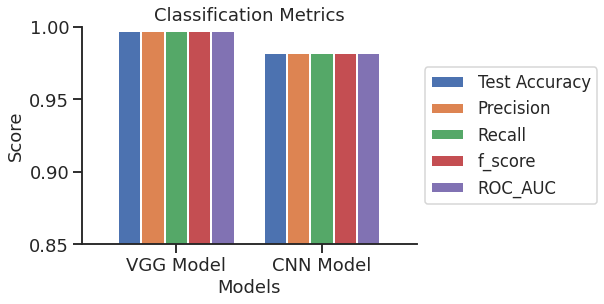

In [ ]:
ax = df_summary.plot.bar(fontsize=18, xlabel='Models',
                            ylabel='Score', width=0.8,rot=0,
                            figsize=(6,4),title="Classification Metrics",alpha=1,
                            edgecolor='white', linewidth=2).legend(loc='center left',bbox_to_anchor=(1.0, 0.5))
plt.ylim([0.85, 1]); 
#plt.xlim([0, 22])

plt.show(block=True)

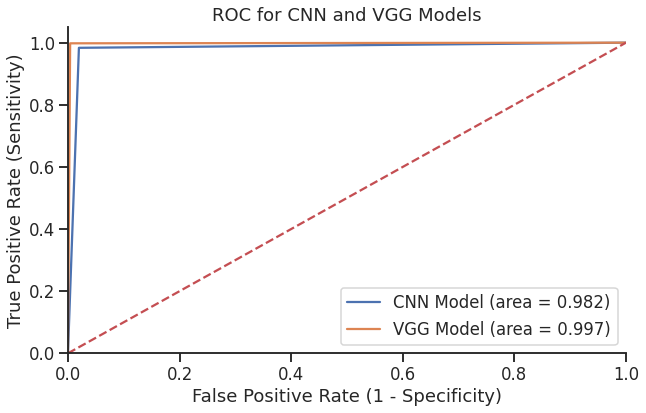

In [ ]:
# Plot ROC for both CNN and VGG models
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)
# Calculating the false positive and true positive rates

roc_auc_cnn = roc_auc_score(y_test, y_pred_cnn)
FP_rate_cnn, TP_rate_cnn, thresholds_cnn = roc_curve(y_test, y_pred_cnn)

roc_auc_vgg = roc_auc_score(y_test, y_pred_vgg)
FP_rate_vgg, TP_rate_vgg, thresholds_vgg = roc_curve(y_test, y_pred_vgg)

plt.figure(figsize=(10,6))

plt.plot(FP_rate_cnn, TP_rate_cnn, label=f'CNN Model (area = {roc_auc_cnn:.3f})')
plt.plot(FP_rate_vgg, TP_rate_vgg, label=f'VGG Model (area = {roc_auc_vgg:.3f})')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC for CNN and VGG Models')
plt.legend(loc="lower right")
plt.show()

# Face detection & Mask detection

In [ ]:
model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Outputs/mask_detector_vgg19.h5")
#model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Outputs/cnn_model.h5")


In [ ]:
def mask_detect(img):
  sns.set_theme(style="white", palette=None)
  img_ary = img_to_array(img)
  detector = MTCNN()
  faces = detector.detect_faces(img_ary);
  plt.figure(figsize=(15, 12))
  plt.imshow(img);
  ax = plt.gca()
  for face in faces:
    x1, y1, width, height = face['box']
    x2, y2 = x1+width, y1+height

    pred = model.predict(smart_resize(img_ary[y1:y2, x1:x2], (256, 256)).reshape(1, 256, 256, 3));
    print(pred)
    if pred[0][0] >= pred[0][1]:
      txt = 'Without Mask'
      color = 'red'
    else:
      txt = 'With Mask'
      color = 'lime'
    
    rect = Rectangle((x1, y1), width, height, fill=False, color=color, linewidth=2)
    ax.add_patch(rect)
    ax.text(x1, y1-2, txt, fontsize=14, fontweight='bold', color=color)
  plt.show()

In [ ]:
test_path = "/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Test_Images"

In [ ]:
from keras.preprocessing import image

In [ ]:
import glob
import cv2
images = [cv2.imread(file) for file in glob.glob(test_path+"/*")]
print('There are {} test images'.format(len(images)))

There are 12 test images


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
scaled_images =[]
for img in images:
  dim = (256,256)
  #img = cv2.imread(test_path+"/maksssksksss643.png")
  #img = images[5]
  if img.shape<(256, 256):
    img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    print('resized')
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  scaled_images.append(img)

resized
resized


[[1.2580789e-07 9.9999988e-01]]
[[9.254098e-05 9.999075e-01]]
[[0.4797748  0.52022517]]
[[0.00821565 0.99178433]]
[[4.3622742e-05 9.9995637e-01]]


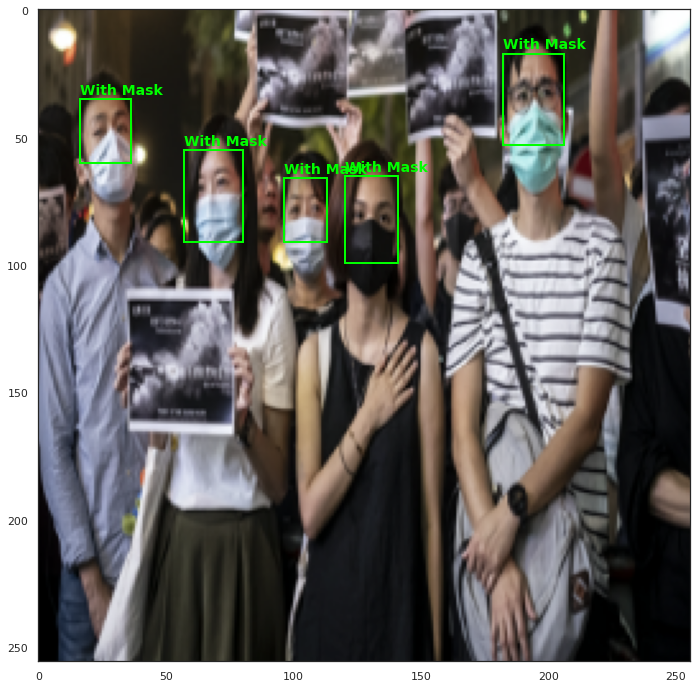

[[0.99569595 0.00430401]]
[[0.66966414 0.33033586]]
[[0.03308166 0.9669183 ]]
[[3.5097852e-05 9.9996495e-01]]


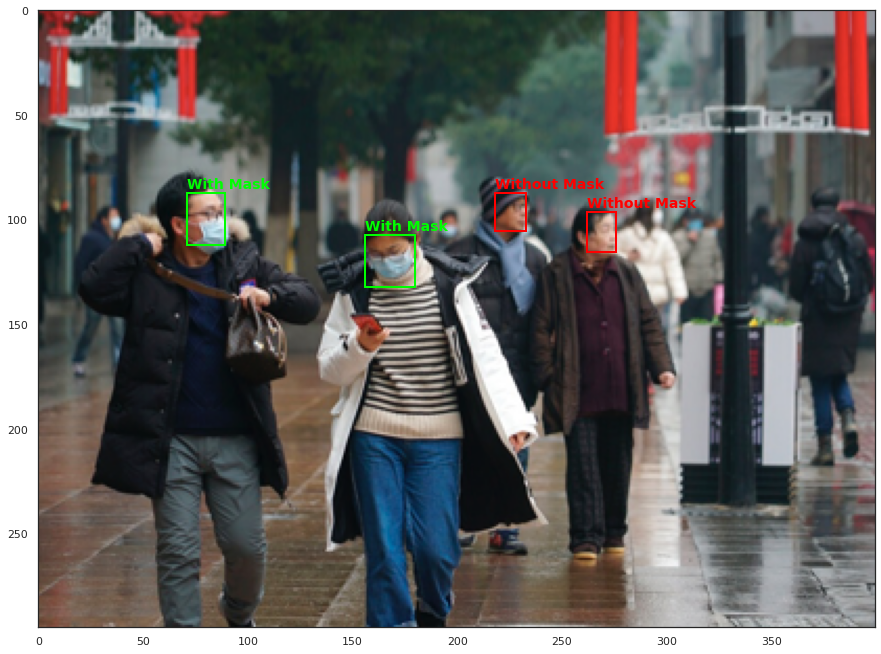

[[1.0000000e+00 1.4517587e-08]]
[[9.9999619e-01 3.7619186e-06]]
[[9.9999988e-01 8.1698474e-08]]
[[9.9999976e-01 2.7961144e-07]]
[[0.9950596 0.0049404]]
[[1.2549411e-08 1.0000000e+00]]
[[0.9485151  0.05148492]]


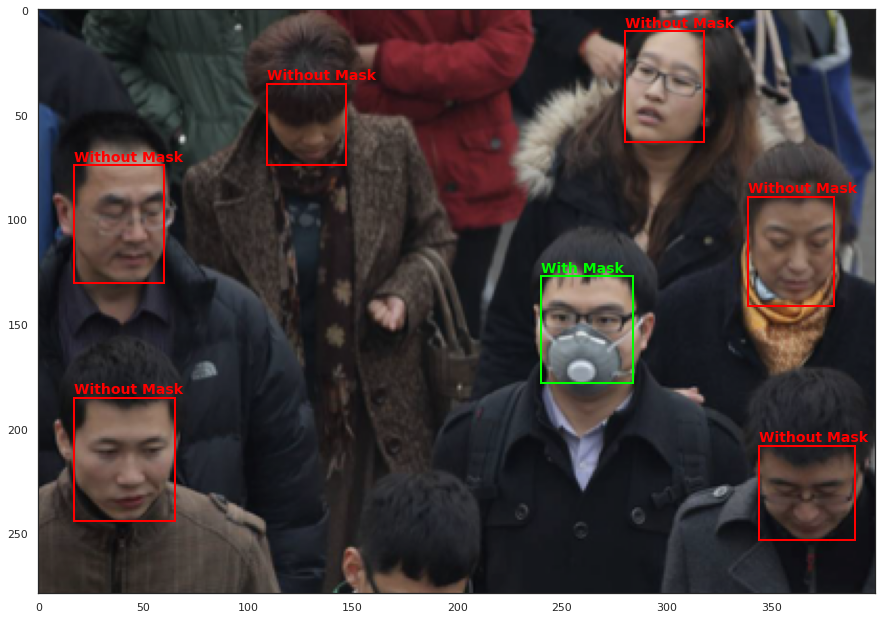

[[3.526481e-21 1.000000e+00]]


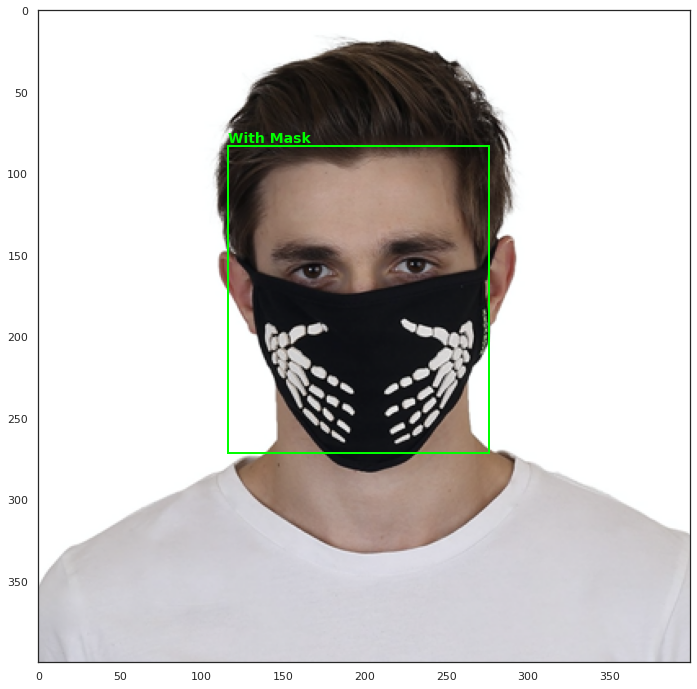

[[0.7584409  0.24155909]]
[[0.9344124  0.06558754]]
[[2.4647873e-06 9.9999750e-01]]
[[1.1815401e-07 9.9999988e-01]]
[[0.59066767 0.40933236]]


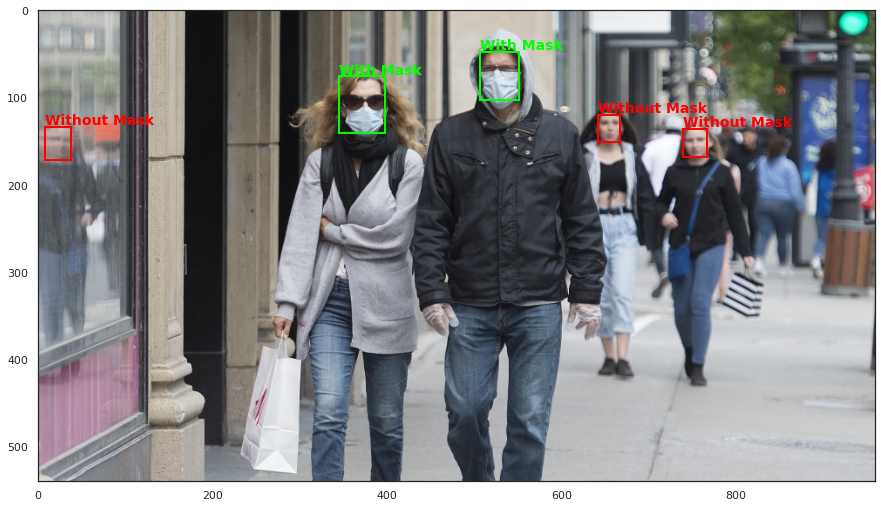

[[2.9484954e-15 1.0000000e+00]]
[[8.413686e-23 1.000000e+00]]
[[4.3427562e-16 1.0000000e+00]]
[[1.2872766e-23 1.0000000e+00]]
[[3.1666584e-20 1.0000000e+00]]
[[7.786315e-12 1.000000e+00]]
[[2.6368222e-14 1.0000000e+00]]


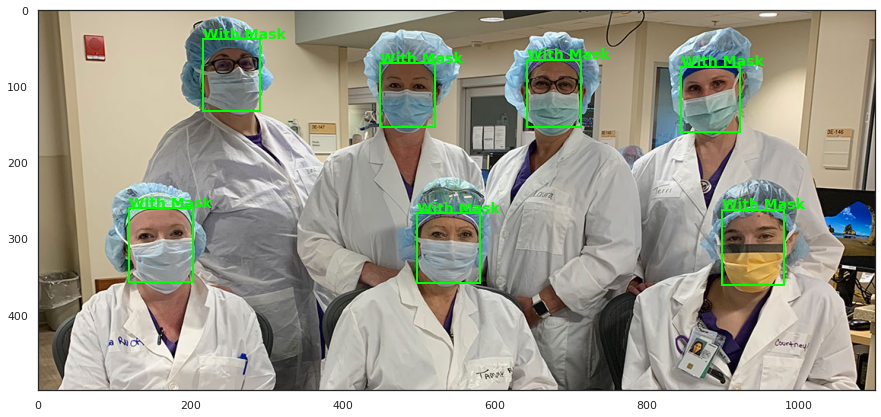

[[1.0000000e+00 1.0994622e-09]]
[[9.9999905e-01 9.3056218e-07]]
[[1.0000000e+00 1.6319698e-08]]
[[0.00268046 0.9973195 ]]
[[3.3830011e-07 9.9999964e-01]]
[[0.14090082 0.8590992 ]]
[[0.01055571 0.9894443 ]]
[[0.32924816 0.67075187]]
[[0.2066254 0.7933746]]
[[1.2788163e-06 9.9999869e-01]]
[[0.70397264 0.29602742]]
[[1.0916205e-12 1.0000000e+00]]
[[0.9388168  0.06118317]]
[[0.06012907 0.9398709 ]]


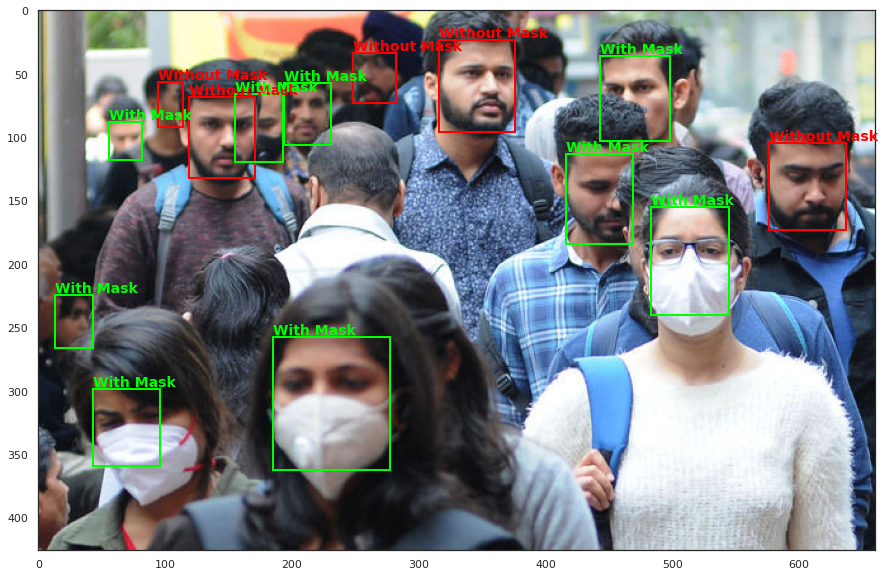

[[1.000000e+00 6.273714e-15]]
[[3.8890504e-09 1.0000000e+00]]
[[0.00328897 0.996711  ]]
[[4.640215e-09 1.000000e+00]]
[[0.9989956 0.0010044]]
[[2.4103192e-06 9.9999762e-01]]


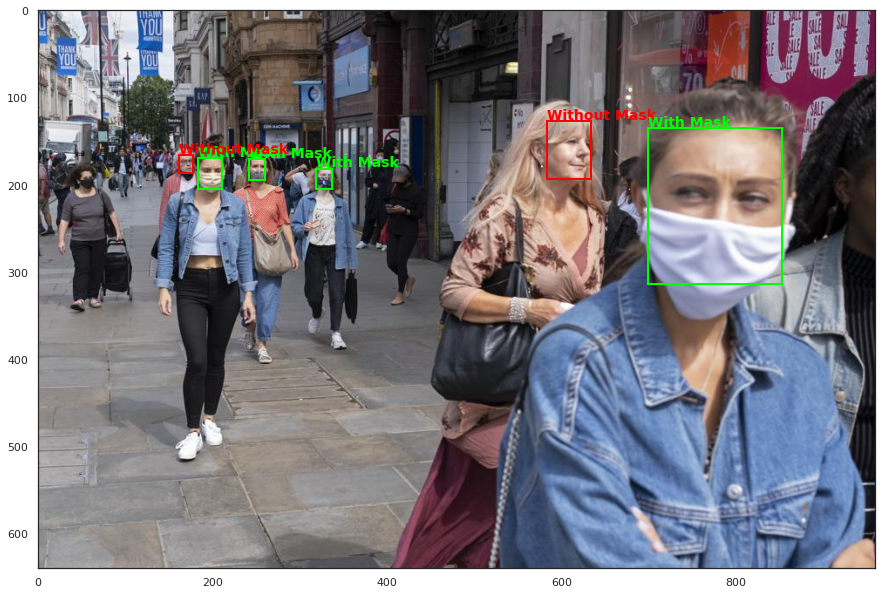

[[1.000000e+00 3.032233e-10]]
[[1.3098085e-10 1.0000000e+00]]
[[9.999901e-01 9.945153e-06]]
[[0.00292309 0.99707687]]


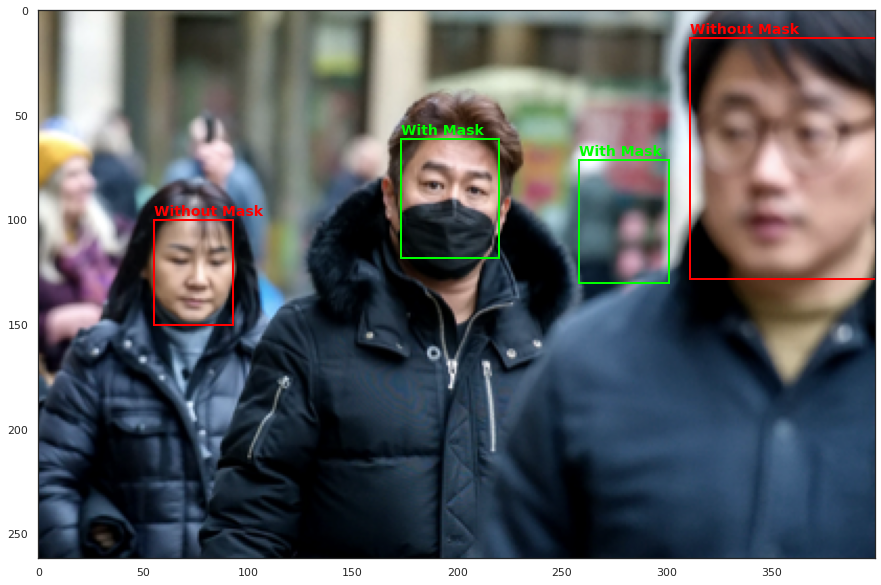

[[9.9999750e-01 2.5073102e-06]]
[[0.9059422  0.09405776]]
[[1.4249502e-04 9.9985743e-01]]
[[7.1854936e-04 9.9928147e-01]]
[[0.74653375 0.25346625]]


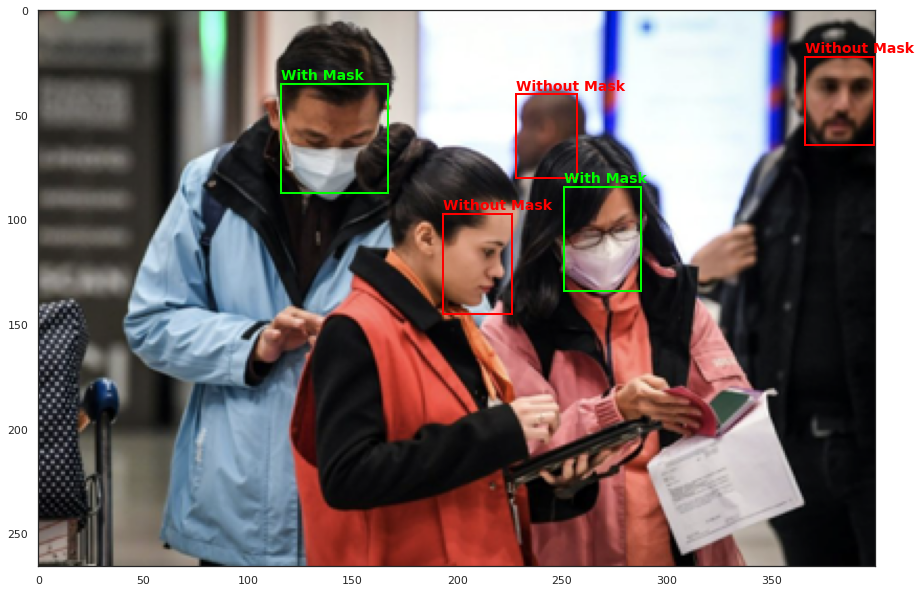

[[0.24426031 0.7557397 ]]
[[2.5376221e-04 9.9974626e-01]]
[[0.98442394 0.01557612]]
[[9.9989581e-01 1.0414528e-04]]
[[9.215276e-04 9.990785e-01]]


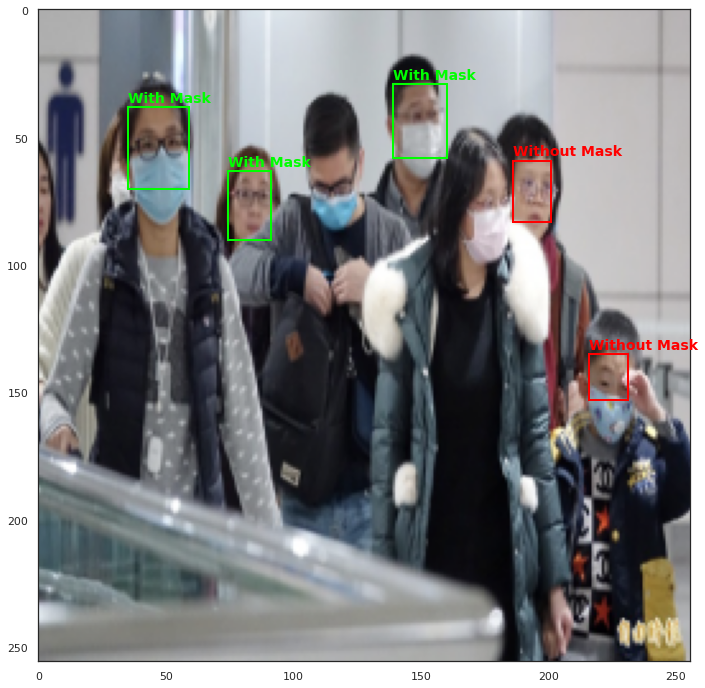

[[9.9913293e-01 8.6714613e-04]]
[[0.9203965 0.0796035]]
[[0.33781815 0.6621818 ]]
[[0.14324297 0.8567571 ]]
[[0.00725265 0.99274737]]
[[0.00852966 0.9914703 ]]
[[1.5930757e-04 9.9984062e-01]]
[[0.41135532 0.5886447 ]]
[[0.00287696 0.99712306]]
[[0.01834233 0.9816576 ]]
[[9.234423e-08 9.999999e-01]]
[[0.00110072 0.9988992 ]]


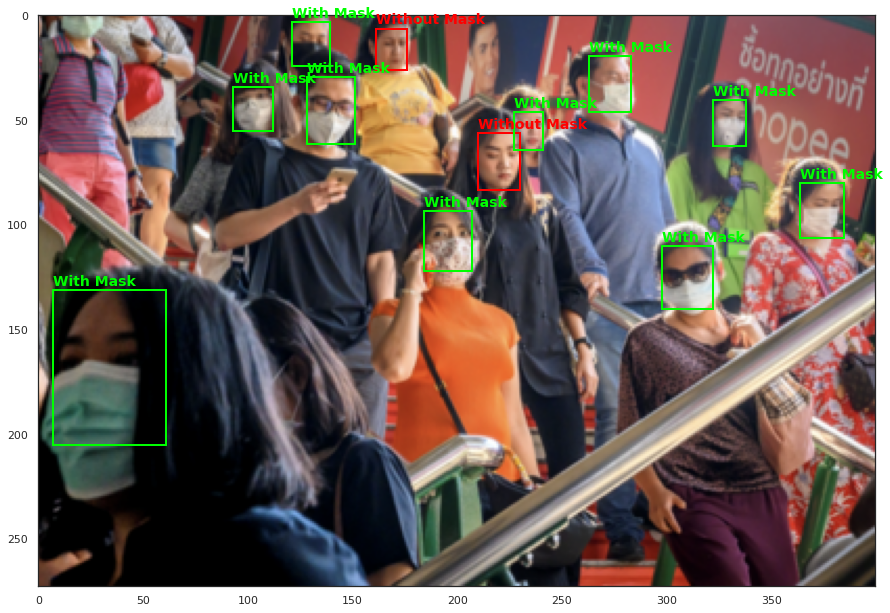

[[6.268318e-08 9.999999e-01]]
[[2.2572913e-06 9.9999774e-01]]


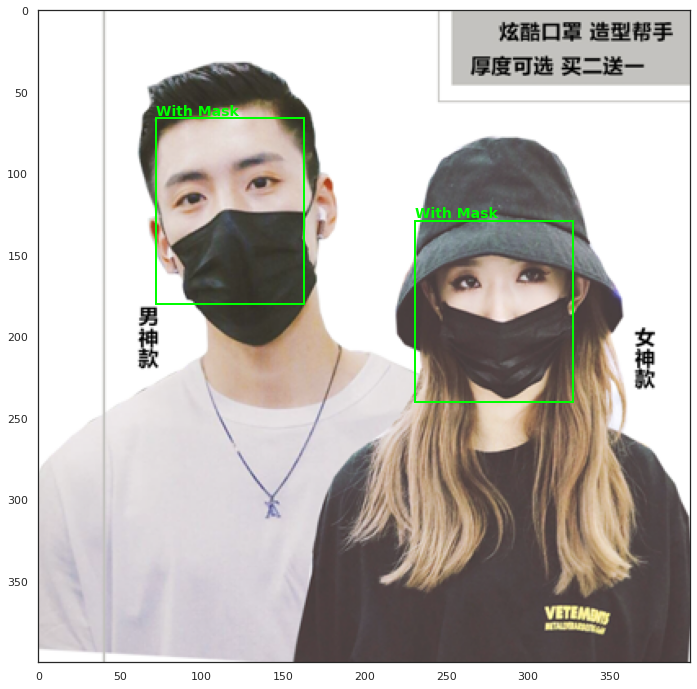

In [ ]:
for image in scaled_images:
  mask_detect(image);